In [3]:

import numpy as np
import os
import matplotlib.pyplot as plt
import cv2
from lightglue import viz2d
from lightglue.utils import load_image
import sfm



In [2]:
# List all functions and attributes in the sfm module
print(dir(sfm))

['__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__spec__', 'calculate_epipolar_distance', 'compute_epipoles', 'compute_normalization_matrix', 'eight_point_algorithm', 'np', 'on_click', 'plot_epipolar_line', 'plt', 'ransac_fundamental_matrix', 'visualize_epipolar_lines']


# Prueba
Voy a probar a cargar un archivo y una foto para ver que soy capaz.

In [4]:
def load_matches_data(npz_file):
    # Cargar datos desde el archivo .npz
    data = np.load(npz_file)
    keypoints0 = data['keypoints0']  # Keypoints de la primera imagen
    keypoints1 = data['keypoints1']  # Keypoints de la segunda imagen
    matches = data['matches']        # Matches entre ambas imágenes
    scores = data.get('scores', None)  # Scores opcionales
    matched_keypoints1 = keypoints0[matches[:, 0]]  # Índices de la primera columna de matches
    matched_keypoints2 = keypoints1[matches[:, 1]]  # Índices de la segunda columna de matches
    
    # Verificar
    
    print(f"Keypoints en imagen 1: {keypoints0.shape}")
    print(f"Keypoints en imagen 2: {keypoints1.shape}")
    print(f"Matches encontrados: {matches.shape}")
    print(f"Puntuaciones de matches: {scores.shape}")
    print(f"Matched keypoints (image 1): {matched_keypoints1.shape}")
    print(f"Matched keypoints (image 2): {matched_keypoints2.shape}")

    return matched_keypoints1, matched_keypoints2, keypoints0, keypoints1, matches, scores

def plot_keypoints(img1, img2, keypoints0, keypoints1, matches):
    
    # Extraer puntos clave emparejados
    m_kpts1 = keypoints0[matches[:, 0]]  # Keypoints emparejados en la imagen 1
    m_kpts2 = keypoints1[matches[:, 1]]  # Keypoints emparejados en la imagen 2
    
    # Visualización con viz2d
    axes = viz2d.plot_images([img1, img2])  # Mostrar las imágenes
    viz2d.plot_matches(m_kpts1, m_kpts2, color="lime", lw=0.2)  # Dibujar matches
    viz2d.add_text(0, f'Total Matches: {len(matches)}')  # Texto con información de matches
    
def prueba_save(img1, img2, keypoints0, keypoints1, matches, name_image):
    
    # Asegurarse de que el directorio existe
    os.makedirs('./images/outliers', exist_ok=True)
    
    # Extraer puntos clave emparejados
    m_kpts1 = keypoints0[matches[:, 0]]  # Keypoints emparejados en la imagen 1
    m_kpts2 = keypoints1[matches[:, 1]]  # Keypoints emparejados en la imagen 2
    
    # Visualización con viz2d
    axes = viz2d.plot_images([img1, img2])  # Mostrar las imágenes
    viz2d.plot_matches(m_kpts1, m_kpts2, color="lime", lw=0.2)  # Dibujar matches
    viz2d.add_text(0, f'Total Matches: {len(matches)}')  # Texto con información de matches
    plt.title('Matches')
    
    # Guardar la imagen
    plt.savefig(f'./images/outliers/{name_image}_OUTLIERS.png')
    plt.close()  # Cerrar la figura para liberar memoria
    
def apply_RANSAC(image1_path, image2_path, matched_keypoints1, matched_keypoints2, nIter=1000, threshold=2  ):

    # Cargar la imagen desde la ruta imaginaria
    image_pers_1 = cv2.imread(image1_path, cv2.IMREAD_COLOR)
    image_pers_2 = cv2.imread(image2_path, cv2.IMREAD_COLOR)

    # Convertir a coordenadas homogéneas
    matched_keypoints1_h = np.hstack((matched_keypoints1, np.ones((matched_keypoints1.shape[0], 1)))).T
    matched_keypoints2_h = np.hstack((matched_keypoints2, np.ones((matched_keypoints2.shape[0], 1)))).T

    # Llamar a RANSAC con los puntos homogéneos filtrados
    best_F, inliers_mask = sfm.ransac_fundamental_matrix(
        matched_keypoints1_h,  # Puntos homogéneos en la imagen 1
        matched_keypoints2_h,  # Puntos homogéneos en la imagen 2
        image1=image_pers_1,            # Opcional: pon tus imágenes aquí si las necesitas
        image2=image_pers_2,            # Opcional: pon tus imágenes aquí si las necesitas
        nIter=1000,             # Número de iteraciones de RANSAC
        threshold=2         # Umbral para considerar un inlier
    )

    # Verificar resultados
    print("Matriz Fundamental calculada por RANSAC:")
    print(best_F)
    print(f"Número de inliers: {np.sum(inliers_mask)}")
    return best_F, inliers_mask

def plot_keypoints_RANSAC(img1, img2, inliers_mask, matched_keypoints1, matched_keypoints2):
    
    outliers_mask = ~inliers_mask
    inliers_kpts1 = matched_keypoints1[inliers_mask[:]]  # Keypoints emparejados en la imagen 1
    inliers_kpts2 = matched_keypoints2[inliers_mask[:]]  # Keypoints emparejados en la imagen 2
    outliers_kpts1 = matched_keypoints1[outliers_mask[:]]  # Keypoints emparejados en la imagen 1
    outliers_kpts2 = matched_keypoints2[outliers_mask[:]]  # Keypoints emparejados en la imagen 2
    print(f"TOTAL number of Keypoints: {matched_keypoints1.shape}")
    
    # Visualización con viz2d para inliers
    axes = viz2d.plot_images([img1, img2])  # Mostrar las imágenes
    viz2d.plot_matches(inliers_kpts1, inliers_kpts2, color="blue", lw=0.2)  # Dibujar matches
    viz2d.add_text(0, f'Total INLIERS: {len(inliers_kpts1)}')  # Texto con información de matches
    
    # Visualización con viz2d para outliers
    axes = viz2d.plot_images([img1, img2])  # Mostrar las imágenes
    viz2d.plot_matches(outliers_kpts1, outliers_kpts2, color="red", lw=0.2)  # Dibujar matches
    viz2d.add_text(0, f'Total OUTLIERS: {len(outliers_kpts1)}')  # Texto con información de matches
    

def plot_inliers_RANSAC(img1, img2, inliers_mask, matched_keypoints1, matched_keypoints2):
    
    outliers_mask = ~inliers_mask
    inliers_kpts1 = matched_keypoints1[inliers_mask[:]]  # Keypoints emparejados en la imagen 1
    inliers_kpts2 = matched_keypoints2[inliers_mask[:]]  # Keypoints emparejados en la imagen 2
    print(f"TOTAL number of Keypoints: {inliers_kpts1.shape}")
    
    # Visualización con viz2d para inliers
    axes = viz2d.plot_images([img1, img2])  # Mostrar las imágenes
    viz2d.plot_matches(inliers_kpts1, inliers_kpts2, color="blue", lw=0.2)  # Dibujar matches
    viz2d.add_text(0, f'Total INLIERS: {len(inliers_kpts1)}')  # Texto con información de matches
    
import os

def export_keypoints_to_colmap(image_name, keypoints, output_dir):
    """
    Exporta puntos clave de una imagen al formato COLMAP.
    
    Args:
        image_name (str): Nombre de la imagen.
        keypoints (numpy.ndarray): Array de puntos clave (N x 2).
        output_dir (str): Directorio donde guardar el archivo .txt.
    """
    output_file = os.path.join(output_dir, f"{image_name}.txt")
    num_features = keypoints.shape[0]
    
    with open(output_file, 'w') as f:
        f.write(f"{num_features} 128\n")  # Número de puntos clave y tamaño del descriptor
        for x, y in keypoints:
            f.write(f"{x + 0.5} {y + 0.5} 0.0 0.0 " + " ".join(["0"] * 128) + "\n")
    
    print(f"Puntos clave exportados: {output_file}")


def export_matches_to_colmap(image1, image2, matches, output_file):
    """
    Exporta las coincidencias entre dos imágenes al formato COLMAP.
    
    Args:
        image1 (str): Nombre de la primera imagen.
        image2 (str): Nombre de la segunda imagen.
        matches (numpy.ndarray): Array de coincidencias (M x 2).
        output_file (str): Archivo de salida para las coincidencias.
    """
    with open(output_file, 'a') as f:  # Abrir en modo 'append' para agregar múltiples pares
        f.write(f"{image1}.jpg {image2}.jpg\n")
        for i, j in matches:
            f.write(f"{i} {j}\n")
        f.write("\n")




In [13]:

npz_file = '../Images/Set_12MP/matches_results/Group1_Group3/Img02_Try1_12M_vs_Img13_Try1_12M_matches.npz'


matched_keypoints1, matched_keypoints2, keypoints0, keypoints1, matches, scores = load_matches_data(npz_file)

# Ejemplo de uso
output_dir = "colmap_keypoints"
os.makedirs(output_dir, exist_ok=True)

print(f"Numero de Keypoints: {keypoints0.shape}")
print(f"Numero de Keypoints: {keypoints1.shape}")
export_keypoints_to_colmap("Img02", keypoints0, output_dir)
export_keypoints_to_colmap("Img13", keypoints1, output_dir)
# Ejemplo de uso
matches_output_file = "colmap_matches/matches.txt"
os.makedirs("colmap_matches", exist_ok=True)

export_matches_to_colmap("Img02", "Img13", matches, matches_output_file)

Keypoints en imagen 1: (5073, 2)
Keypoints en imagen 2: (5113, 2)
Matches encontrados: (1737, 2)
Puntuaciones de matches: (1737,)
Matched keypoints (image 1): (1737, 2)
Matched keypoints (image 2): (1737, 2)
Numero de Keypoints: (5073, 2)
Numero de Keypoints: (5113, 2)
Puntos clave exportados: colmap_keypoints/Img02.txt
Puntos clave exportados: colmap_keypoints/Img13.txt


In [5]:
import glob

npz_files = glob.glob("./results/inliers/colmap/*.npz")
output_dir = "colmap_keypoints"
matches_output_file = "colmap_matches/matches.txt"

os.makedirs(output_dir, exist_ok=True)
os.makedirs("colmap_matches", exist_ok=True)

for npz_file in npz_files:
    data = np.load(npz_file)
    keypoints0 = data['keypoints0']
    keypoints1 = data['keypoints1']
    matches = data['matches']
    
    # Extraer nombres de imágenes del archivo
    image1, image2 = os.path.basename(npz_file).split("_vs_")
    image1 = image1.replace("_INLIERS.png", "")
    image2 = image2.replace("_INLIERS.png", "")
    
    # Exportar keypoints
    export_keypoints_to_colmap(image1, keypoints0, output_dir)
    export_keypoints_to_colmap(image2, keypoints1, output_dir)
    
    # Exportar matches
    export_matches_to_colmap(image1, image2, matches, matches_output_file)


Puntos clave exportados: colmap_keypoints/Img02_Try1_12M.txt
Puntos clave exportados: colmap_keypoints/Img15_Try3_12M_inliers.npz.txt
Puntos clave exportados: colmap_keypoints/Img02_Try1_12M.txt
Puntos clave exportados: colmap_keypoints/Img13_Try1_12M_inliers.npz.txt
Puntos clave exportados: colmap_keypoints/Img02_Try1_12M.txt
Puntos clave exportados: colmap_keypoints/Img23_Try1_12M_inliers.npz.txt
Puntos clave exportados: colmap_keypoints/Img02_Try1_12M.txt
Puntos clave exportados: colmap_keypoints/Img28_Try1_12M_inliers.npz.txt
Puntos clave exportados: colmap_keypoints/Img02_Try1_12M.txt
Puntos clave exportados: colmap_keypoints/Img14_Try1_12M_inliers.npz.txt
Puntos clave exportados: colmap_keypoints/Img02_Try1_12M.txt
Puntos clave exportados: colmap_keypoints/Img12_Try2_12M_inliers.npz.txt
Puntos clave exportados: colmap_keypoints/Img02_Try1_12M.txt
Puntos clave exportados: colmap_keypoints/Img25_Try1_12M_inliers.npz.txt
Puntos clave exportados: colmap_keypoints/Img02_Try1_12M.txt
P

In [ ]:

# Cargar imágenes
img1 = load_image(image1_path)
img2 = load_image(image2_path)

matched_keypoints1, matched_keypoints2, keypoints0, keypoints1, matches, scores = load_matches_data(npz_file)


best_F, inliers_mask = apply_RANSAC(
        image1_path,
        image2_path,
        matched_keypoints1,
        matched_keypoints2,
        nIter=1000,
        threshold=2
    )

# Llamar a la función
plot_keypoints(img1, img2, keypoints0, keypoints1, matches)
plot_keypoints_RANSAC(img1, img2, inliers_mask, matched_keypoints1, matched_keypoints2)

In [62]:
prueba_save(img1, img2, keypoints0, keypoints1, matches, "hola")

In [27]:
# Vamos a comparar F con la matriz fundamental calculada por OpenCV
F_opencv, mask = cv2.findFundamentalMat(matched_keypoints1, matched_keypoints2, cv2.FM_RANSAC, 2.0)
print("Matriz Fundamental calculada por OpenCV:")
print(F_opencv) 
print("Matriz Fundamental calculada por RANSAC:")
print(best_F)
error_forbenius = np.linalg.norm(F_opencv - best_F, ord='fro')
print(f"Error de Frobenius entre F_opencv y best_F: {error_forbenius}")

Matriz Fundamental calculada por OpenCV:
[[-1.68240233e-07  1.43072934e-05 -2.57672500e-03]
 [-1.50127139e-05  3.57418994e-08  3.29770361e-03]
 [ 1.55789645e-02 -2.42429228e-02  1.00000000e+00]]
Matriz Fundamental calculada por RANSAC:
[[ 2.01974425e-07 -2.97610953e-05  4.37427622e-03]
 [ 3.16565734e-05  3.32840553e-08 -7.17537381e-03]
 [-2.70418223e-02  5.13839529e-02 -1.50622617e+00]]
Error de Frobenius entre F_opencv y best_F: 2.507760669597912


In [46]:
# Comparar inliers_mask y mask
print(mask.flatten().astype(bool)[0:10])
# Extraer los keypoints correspondientes a los inliers
prueba_mask = matched_keypoints1[mask.flatten().astype(bool)]
print(matched_keypoints1[0:10,:])
print(prueba_mask[0:10,:])
print("Shape de inliers_mask:", inliers_mask.shape)
print("Shape de matched_keypoints1:", matched_keypoints1.shape)


[False  True  True  True False False False  True  True False]
[[ 15.546387  10.113281]
 [ 19.89795   12.834636]
 [ 22.617676  12.834636]
 [164.04346   15.011719]
 [143.91748   15.55599 ]
 [ 51.990723  21.542969]
 [102.57764   24.264322]
 [164.04346   24.264322]
 [ 36.760254  30.251303]
 [136.30225   30.251303]]
[[ 19.89795   12.834636]
 [ 22.617676  12.834636]
 [164.04346   15.011719]
 [164.04346   24.264322]
 [ 36.760254  30.251303]
 [ 29.688965  30.795572]
 [500.7456    38.959637]
 [ 23.705566  40.048176]
 [ 19.354004  58.553387]
 [199.3999    59.097656]]
Shape de inliers_mask: (790,)
Shape de matched_keypoints1: (790, 2)


TOTAL number of Keypoints: (173, 2)
TOTAL number of Keypoints: (169, 2)


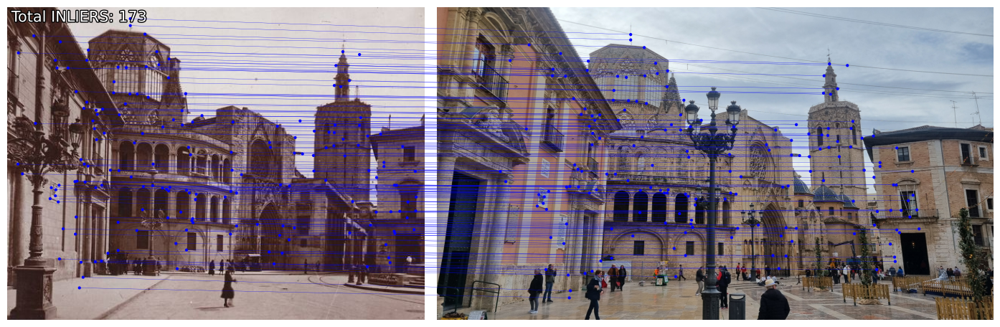

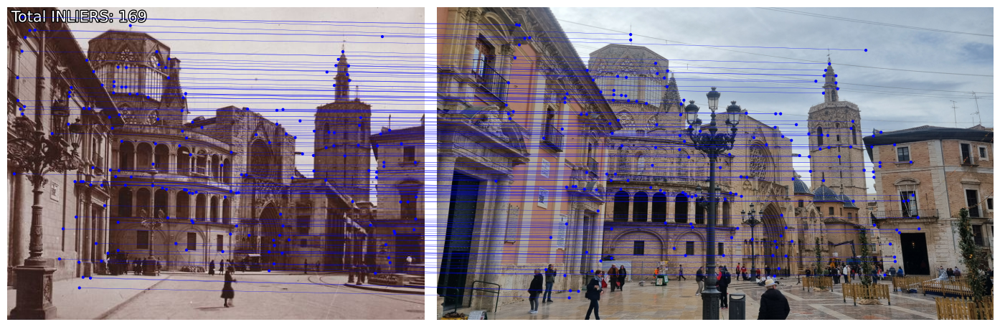

In [49]:
plot_inliers_RANSAC(img1, img2, inliers_mask, matched_keypoints1, matched_keypoints2)
plot_inliers_RANSAC(img1, img2, mask.flatten().astype(bool)[:], matched_keypoints1, matched_keypoints2)

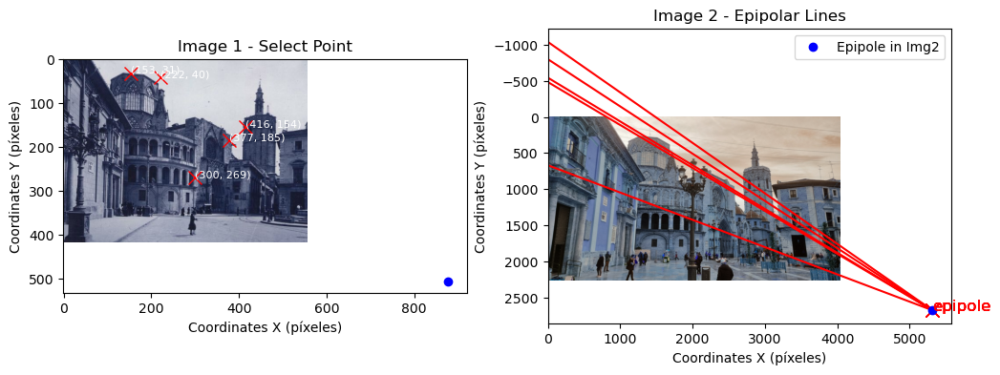

In [16]:
image_pers_1 = cv2.imread(image1_path, cv2.IMREAD_COLOR)
image_pers_2 = cv2.imread(image2_path, cv2.IMREAD_COLOR)
sfm.visualize_epipolar_lines(best_F, image_pers_1, image_pers_2, show_epipoles=True)

Número de iteraciones:  1000
Más votos conseguidos:  432
Matriz Fundamental calculada por RANSAC:
[[-7.91970901e-08 -4.23034069e-06  8.06371764e-03]
 [ 4.25986695e-06 -1.00068886e-07 -7.70488096e-03]
 [-7.79192696e-03  7.63506048e-03  1.47073838e-01]]
Número de inliers: 432
TOTAL number of Keypoints: (1362, 2)


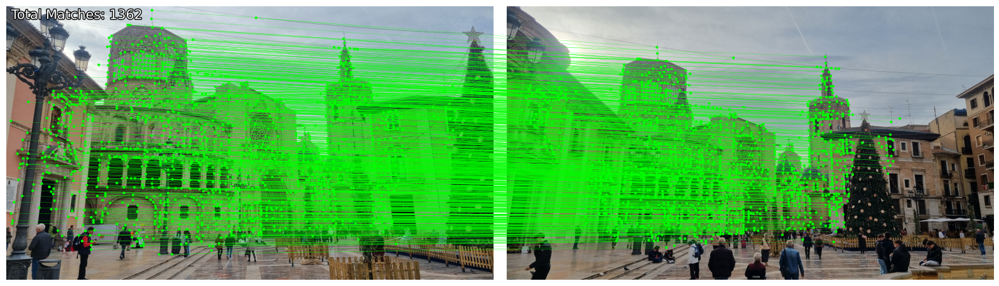

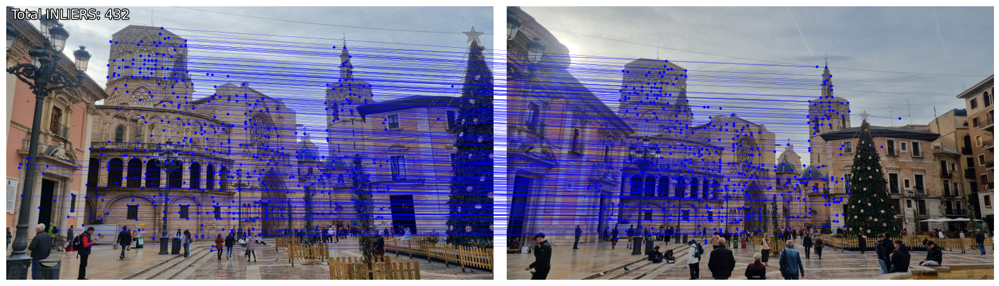

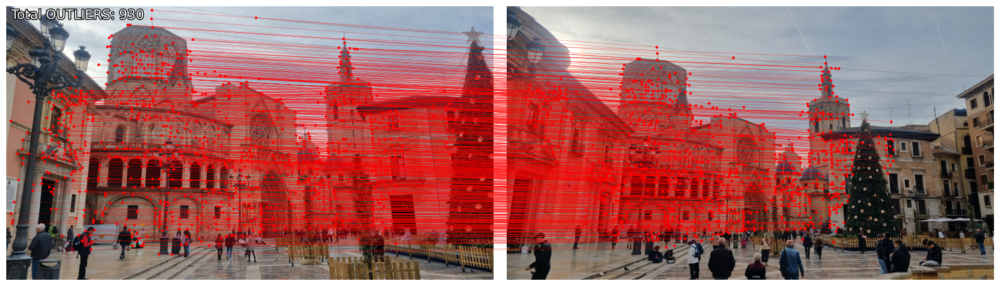

In [101]:

npz_file = '../Images/Set_12MP/matches_results/Group1_Group1/Img13_Try1_12M_vs_Img25_Try1_12M_matches.npz'
image1_path = "../Images/Set_12MP/Group1/Img13_Try1_12M.jpg"
image2_path = "../Images/Set_12MP/Group1/Img25_Try1_12M.jpg"

# Cargar imágenes
img1 = load_image(image1_path)
img2 = load_image(image2_path)

matched_keypoints1, matched_keypoints2, keypoints0, keypoints1, matches, scores = load_matches_data(npz_file)

best_F, inliers_mask = apply_RANSAC(
        image1_path,
        image2_path,
        matched_keypoints1,
        matched_keypoints2,
        nIter=1000,
        threshold=2
    )

plot_keypoints(img1, img2, keypoints0, keypoints1, matches)
plot_keypoints_RANSAC(img1, img2, inliers_mask, matched_keypoints1, matched_keypoints2)



Número de iteraciones:  1000
Más votos conseguidos:  430
Matriz Fundamental calculada por RANSAC:
[[ 1.20995528e-07  7.77310426e-06 -1.43572112e-02]
 [-7.72692386e-06  1.09222541e-07  1.34478000e-02]
 [ 1.38782140e-02 -1.34178078e-02 -9.60225511e-02]]
Número de inliers: 430
TOTAL number of Keypoints: (1362, 2)


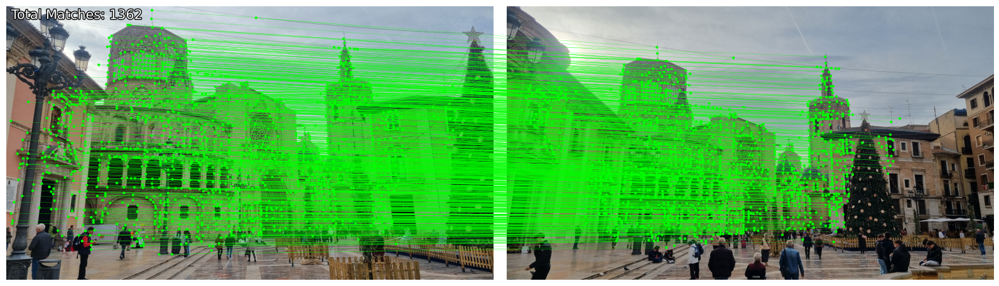

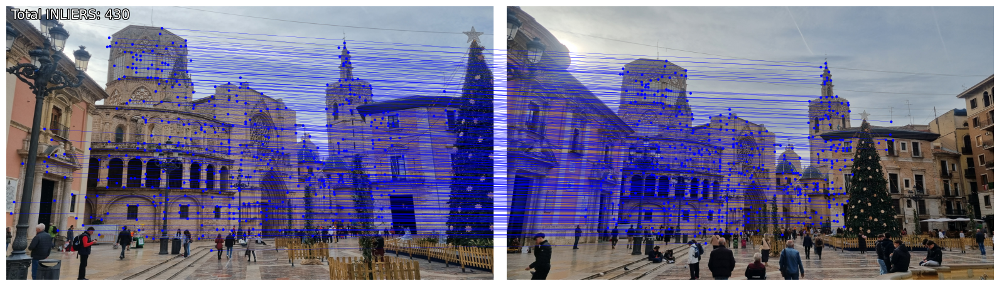

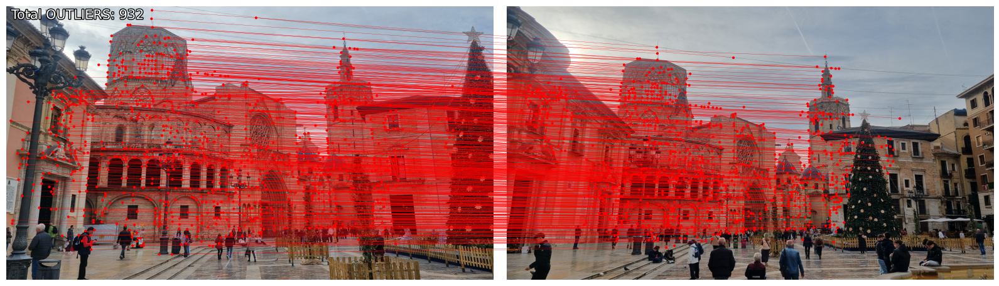

In [102]:

npz_file = '../Images/Set_12MP/matches_results/Group1_Group1/Img13_Try1_12M_vs_Img25_Try1_12M_matches.npz'
image1_path = "../Images/Set_12MP/Group1/Img13_Try1_12M.jpg"
image2_path = "../Images/Set_12MP/Group1/Img25_Try1_12M.jpg"

# Cargar imágenes
img1 = load_image(image1_path)
img2 = load_image(image2_path)

matched_keypoints1, matched_keypoints2, keypoints0, keypoints1, matches, scores = load_matches_data(npz_file)

best_F, inliers_mask = apply_RANSAC(
        image1_path,
        image2_path,
        matched_keypoints1,
        matched_keypoints2,
        nIter=1000,
        threshold=4
    )

plot_keypoints(img1, img2, keypoints0, keypoints1, matches)
plot_keypoints_RANSAC(img1, img2, inliers_mask, matched_keypoints1, matched_keypoints2)



Keypoints en imagen 1: (2296, 2)
Keypoints en imagen 2: (5064, 2)
Matches encontrados: (541, 2)
Puntuaciones de matches: (541,)
Matched keypoints (image 1): (541, 2)
Matched keypoints (image 2): (541, 2)
Número de iteraciones:  1000
Más votos conseguidos:  113
Matriz Fundamental calculada por RANSAC:
[[-6.72127169e-08  1.96178781e-06 -5.59548168e-04]
 [-2.59852264e-06 -1.12896780e-06  3.33145492e-03]
 [ 4.67026159e-03 -1.64435215e-02  3.49637102e-03]]
Número de inliers: 113
TOTAL number of Keypoints: (541, 2)


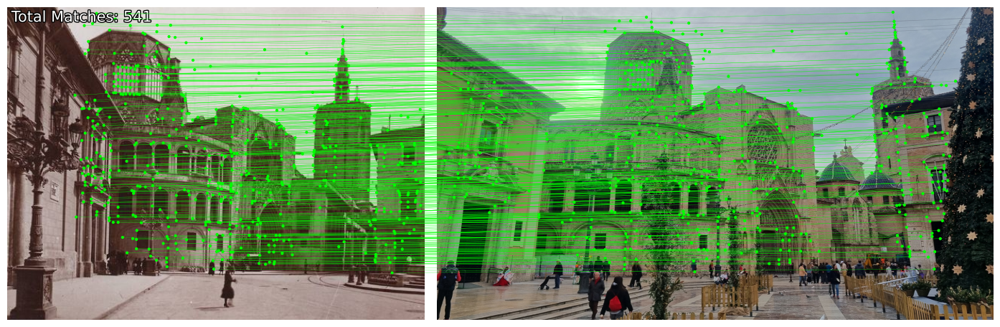

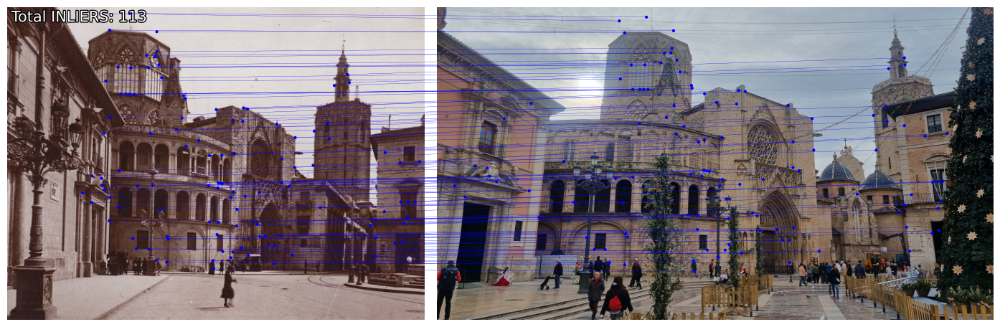

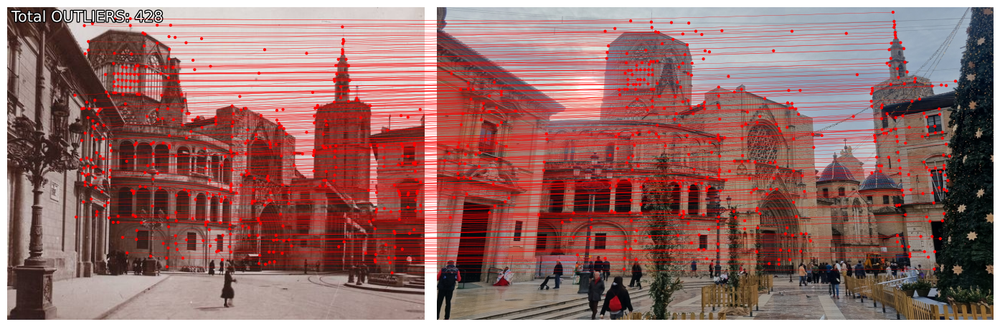

In [4]:

npz_file = '../Images/Set_12MP/matches_results/Original_Group1/Img14_Try1_12M_matches.npz'
image1_path = "../Images/original.jpg"
image2_path = "../Images/Set_12MP/Group1/Img14_Try1_12M.jpg"

# Cargar imágenes
img1 = load_image(image1_path)
img2 = load_image(image2_path)

matched_keypoints1, matched_keypoints2, keypoints0, keypoints1, matches, scores = load_matches_data(npz_file)

best_F, inliers_mask = apply_RANSAC(
        image1_path,
        image2_path,
        matched_keypoints1,
        matched_keypoints2,
        nIter=1000,
        threshold=4
    )

plot_keypoints(img1, img2, keypoints0, keypoints1, matches)
plot_keypoints_RANSAC(img1, img2, inliers_mask, matched_keypoints1, matched_keypoints2)



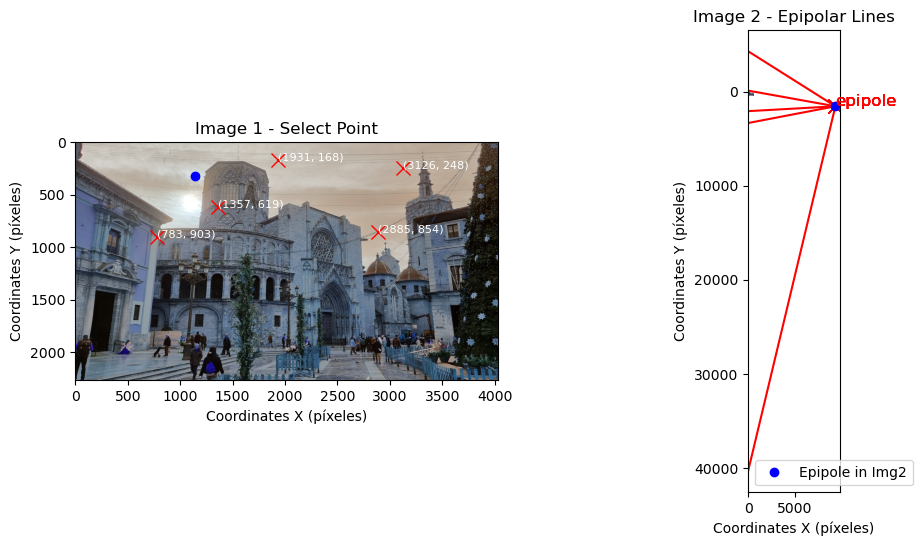

In [10]:
image_pers_1 = cv2.imread(image1_path, cv2.IMREAD_COLOR)
image_pers_2 = cv2.imread(image2_path, cv2.IMREAD_COLOR)
sfm.visualize_epipolar_lines(best_F, image_pers_2, image_pers_1, show_epipoles=True)
